# FIFA project - Manchester City 

In [2]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model

In [4]:
#reading the csv file and naming the dataframe
fifa = pd.read_csv("C:\\Users\\miquelemelo\\Downloads\\fifa21_male2.csv")

C:\Users\miquelemelo\AppData\Local\Temp\ipykernel_8996\952926035.py:2: DtypeWarning: Columns (78) have mixed types. Specify dtype option on import or set low_memory=False.
  fifa = pd.read_csv("C:\\Users\\miquelemelo\\Downloads\\fifa21_male2.csv")


In [183]:
#checking the data size
fifa.shape

(17125, 107)

In [184]:
#checking the columns
fifa.columns
list(fifa.columns)

['ID',
 'Name',
 'Age',
 'OVA',
 'Nationality',
 'Club',
 'BOV',
 'BP',
 'Position',
 'Player Photo',
 'Club Logo',
 'Flag Photo',
 'POT',
 'Team & Contract',
 'Height',
 'Weight',
 'foot',
 'Growth',
 'Joined',
 'Loan Date End',
 'Value',
 'Wage',
 'Release Clause',
 'Contract',
 'Attacking',
 'Crossing',
 'Finishing',
 'Heading Accuracy',
 'Short Passing',
 'Volleys',
 'Skill',
 'Dribbling',
 'Curve',
 'FK Accuracy',
 'Long Passing',
 'Ball Control',
 'Movement',
 'Acceleration',
 'Sprint Speed',
 'Agility',
 'Reactions',
 'Balance',
 'Power',
 'Shot Power',
 'Jumping',
 'Stamina',
 'Strength',
 'Long Shots',
 'Mentality',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Defending',
 'Marking',
 'Standing Tackle',
 'Sliding Tackle',
 'Goalkeeping',
 'GK Diving',
 'GK Handling',
 'GK Kicking',
 'GK Positioning',
 'GK Reflexes',
 'Total Stats',
 'Base Stats',
 'W/F',
 'SM',
 'A/W',
 'D/W',
 'IR',
 'PAC',
 'SHO',
 'PAS',
 'DRI',
 'DEF',
 'PHY',
 

In [185]:
#checking how many null or NAN's we have in the dataframe
fifa.isnull().sum()[fifa.isnull().sum() > 0]

Club                 23
Position            413
Club Logo            23
Joined               58
Loan Date End     16215
Volleys              58
Curve                58
Agility              58
Balance              58
Jumping              58
Interceptions         7
Positioning           7
Vision               58
Composure           423
Sliding Tackle       58
A/W                  89
D/W                  89
dtype: int64

In [186]:
#The objective here is to check which players are in the Manchester City team and those ones that are not in the general Top 10
#we would than buy the player so the Manchester City team has all players in the TOP 10

In [187]:
fifa['Contract'].shape


(17125,)

In [188]:
#creating a function to only select the players who the contract are in between 2021-2025
def contracts(df, column_name):
    df_2021 = df[df[column_name].astype(str).str.contains('2021|2022|2023|2024|2025')]
    return df_2021




In [6]:
fifa_2021 = fifa

In [190]:
#creating a new dataframe with only the important columns and also sorting by OVA
fifa_2021 = fifa_2021[['Name',
 'Age', 'Value',
 'OVA', 'Wage', 'BP', 'Contract'
 ]].sort_values('OVA', ascending=False)
fifa_2021

,Name,Age,Value,OVA,Wage,BP,Contract
752,L. Messi,33,€67.5M,93,€560K,RW,2004 ~ 2021
142,Cristiano Ronaldo,35,€46M,92,€220K,ST,2018 ~ 2022
2871,K. De Bruyne,29,€87M,91,€370K,CAM,2015 ~ 2023
2287,R. Lewandowski,31,€80M,91,€240K,ST,2014 ~ 2023
2650,Neymar Jr,28,€90M,91,€270K,LW,2017 ~ 2022
3665,J. Oblak,27,€75M,91,€125K,GK,2014 ~ 2023
2790,M. ter Stegen,28,€69.5M,90,€260K,GK,2014 ~ 2022
9331,K. Mbappé,21,€105.5M,90,€160K,ST,2018 ~ 2022
5777,Alisson,27,€62.5M,90,€160K,GK,2018 ~ 2024
4166,V. van Dijk,28,€75.5M,90,€210K,CB,2018 ~ 2023


In [191]:
#creating new columns in the dataframe so we can manipulate better the information
fifa_2021[['Begining', 'Ending']] = fifa_2021['Contract'].str.split(' ~ ', expand = True)
fifa_2021

,Name,Age,Value,OVA,Wage,BP,Contract,Begining,Ending
752,L. Messi,33,€67.5M,93,€560K,RW,2004 ~ 2021,2004,2021
142,Cristiano Ronaldo,35,€46M,92,€220K,ST,2018 ~ 2022,2018,2022
2871,K. De Bruyne,29,€87M,91,€370K,CAM,2015 ~ 2023,2015,2023
2287,R. Lewandowski,31,€80M,91,€240K,ST,2014 ~ 2023,2014,2023
2650,Neymar Jr,28,€90M,91,€270K,LW,2017 ~ 2022,2017,2022
3665,J. Oblak,27,€75M,91,€125K,GK,2014 ~ 2023,2014,2023
2790,M. ter Stegen,28,€69.5M,90,€260K,GK,2014 ~ 2022,2014,2022
9331,K. Mbappé,21,€105.5M,90,€160K,ST,2018 ~ 2022,2018,2022
5777,Alisson,27,€62.5M,90,€160K,GK,2018 ~ 2024,2018,2024
4166,V. van Dijk,28,€75.5M,90,€210K,CB,2018 ~ 2023,2018,2023


In [192]:
#checking which players are in the Manchester City team and assigning them to a new dataframe
fifa_2021 = contracts(fifa, 'Contract')
Manch_Team = fifa_2021[fifa_2021['Club'] == 'Manchester City']
Manch_Team1 = Manch_Team[['Name',
 'Age', 'Value',
 'OVA', 'Wage', 'BP', 'Contract'
 ]].sort_values('OVA', ascending=False)

In [193]:
#removing the players who are on loan to other teams
Manch_Team1 = Manch_Team1[~Manch_Team1['Contract'].str.contains('On Loan')]

In [194]:
#creating new columns and spliting the Contract column in two so we can manipulate the dataframe better
Manch_Team1[['Begining', 'Ending']] = Manch_Team1['Contract'].str.split(' ~ ', expand = True)
Manch_Team1

,Name,Age,Value,OVA,Wage,BP,Contract,Begining,Ending
2871,K. De Bruyne,29,€87M,91,€370K,CAM,2015 ~ 2023,2015,2023
662,S. Agüero,32,€53M,89,€300K,ST,2011 ~ 2021,2011,2021
5256,Ederson,26,€53.5M,88,€195K,GK,2017 ~ 2024,2017,2024
4049,R. Sterling,25,€72.5M,88,€270K,LW,2015 ~ 2023,2015,2023
6605,Bernardo Silva,25,€60M,87,€230K,RW,2017 ~ 2025,2017,2025
5642,A. Laporte,26,€56M,87,€200K,CB,2018 ~ 2024,2018,2024
9351,Rodri,24,€44M,85,€145K,CDM,2019 ~ 2024,2019,2024
2264,K. Walker,30,€30.5M,85,€170K,RB,2017 ~ 2024,2017,2024
4366,R. Mahrez,29,€37.5M,85,€210K,RW,2018 ~ 2023,2018,2023
401,Fernandinho,35,€9.5M,84,€110K,CB,2013 ~ 2021,2013,2021


In [195]:
#checking which players has the contracts ending in 2021
Mach_future = Manch_Team1[Manch_Team1['Ending'] >'2021']
Mach_future

,Name,Age,Value,OVA,Wage,BP,Contract,Begining,Ending
2871,K. De Bruyne,29,€87M,91,€370K,CAM,2015 ~ 2023,2015,2023
5256,Ederson,26,€53.5M,88,€195K,GK,2017 ~ 2024,2017,2024
4049,R. Sterling,25,€72.5M,88,€270K,LW,2015 ~ 2023,2015,2023
6605,Bernardo Silva,25,€60M,87,€230K,RW,2017 ~ 2025,2017,2025
5642,A. Laporte,26,€56M,87,€200K,CB,2018 ~ 2024,2018,2024
9351,Rodri,24,€44M,85,€145K,CDM,2019 ~ 2024,2019,2024
2264,K. Walker,30,€30.5M,85,€170K,RB,2017 ~ 2024,2017,2024
4366,R. Mahrez,29,€37.5M,85,€210K,RW,2018 ~ 2023,2018,2023
9061,Gabriel Jesus,23,€34.5M,83,€150K,ST,2016 ~ 2023,2016,2023
5319,João Cancelo,26,€28M,83,€140K,RWB,2019 ~ 2025,2019,2025


In [196]:
#the intention is to have a team with 1 GK, 1 RWB, 1 LWB, 2 CB, 1CDM,  1 CM, 1 CAM, 1 RW, 1 LW and 1 ST

In [197]:
def find_best_player(team_data, position):
    position_data = team_data.loc[team_data['BP'] == position]
    max_ova = position_data['OVA'].max()
    best_player = position_data.loc[position_data['OVA'] == max_ova, ['Name', 'OVA']]
    return best_player
find_best_player(Mach_future, 'ST')


,Name,OVA
9061,Gabriel Jesus,83


In [198]:
#creating a function to find the best players and applying the function to the Manchester city dataframe

def find_best_players(team_data, positions):
    best_players = []
    for position in positions:
        position_data = team_data.loc[team_data['BP'] == position]
        max_ova = position_data['OVA'].max()
        best_player = position_data.loc[position_data['OVA'] == max_ova, ['Name', 'OVA']]
        if not best_player.empty:
            best_players.append([position, best_player.iloc[0]['Name'], best_player.iloc[0]['OVA']])
    return pd.DataFrame(best_players, columns=['Position', 'Name', 'OVA'])

criteria = ['GK', 'RWB', 'LWB', 'CB', 'RB', 'CDM', 'CM', 'CAM', 'RW', 'LW', 'ST']

best_players_df = find_best_players(Mach_future, criteria)

print(pd.DataFrame(best_players_df))


   Position            Name  OVA
0        GK         Ederson   88
1       RWB    João Cancelo   83
2       LWB        B. Mendy   81
3        CB      A. Laporte   87
4        RB       K. Walker   85
5       CDM           Rodri   85
6        CM     I. Gündoğan   83
7       CAM    K. De Bruyne   91
8        RW  Bernardo Silva   87
9        LW     R. Sterling   88
10       ST   Gabriel Jesus   83


In [199]:
#the outcome above shows the best players in the manchester city team with the max OVA and for each position

In [200]:
def find_best_players(team_data, positions):
    best_players = []
    for position in positions:
        position_data = team_data.loc[team_data['BP'] == position]
        top_players = position_data.nlargest(10, 'OVA')[['Name', 'OVA']]
        for index, player in top_players.iterrows():
            best_players.append([position, player['Name'], player['OVA']])
    return pd.DataFrame(best_players, columns=['Position', 'Name', 'OVA'])

criteria = ['GK', 'RWB', 'LWB', 'CB', 'RB', 'CDM', 'CM', 'CAM', 'RW', 'LW', 'ST']

best_players_df2 = find_best_players(fifa_2021, criteria)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
print(pd.DataFrame(best_players_df2))

    Position                 Name  OVA
0         GK             J. Oblak   91
1         GK        M. ter Stegen   90
2         GK              Alisson   90
3         GK             M. Neuer   89
4         GK          T. Courtois   89
5         GK        S. Handanovič   88
6         GK              Ederson   88
7         GK            H. Lloris   87
8         GK          W. Szczęsny   87
9         GK             K. Navas   87
10       RWB         João Cancelo   83
11       RWB        Nélson Semedo   83
12       RWB      Mário Fernandes   82
13       RWB           M. Doherty   81
14       RWB         P. Kadeřábek   80
15       RWB              K. Lala   79
16       RWB            L. Dubois   79
17       RWB           C. Ansaldi   78
18       RWB          D. da Costa   78
19       RWB        L. Spinazzola   78
20       LWB             Grimaldo   84
21       LWB                 Gayà   83
22       LWB             B. Mendy   81
23       LWB                Jonny   81
24       LWB         Adry

In [201]:
#the outcome above shows the top 10 players in the whole Dataframe

In [202]:
# here we wanna check if the players are in both dataframes (Manchester City and FIFA)
for player in best_players_df['Name']:
    if player in best_players_df2['Name'].values:
        print(player, 'is in both DataFrames')
    else:
        print(player, 'is only in df1')

Ederson is in both DataFrames
João Cancelo is in both DataFrames
B. Mendy is in both DataFrames
A. Laporte is in both DataFrames
K. Walker is in both DataFrames
Rodri is in both DataFrames
I. Gündoğan is only in df1
K. De Bruyne is in both DataFrames
Bernardo Silva is in both DataFrames
R. Sterling is in both DataFrames
Gabriel Jesus is only in df1


#now we know that we have two players that are not in both dataframes and with that we have 2 players that are not in the FIFA
#top10. We will change the players

In [203]:
fifa_2021[fifa_2021['Name'] == 'K. Mbappé']

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,Club Logo,Flag Photo,POT,Team & Contract,Height,Weight,foot,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Contract,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
9331,231747,K. Mbappé,21,90,France,Paris Saint-Germain,91,ST,ST LW RW,https://cdn.sofifa.com/players/231/747/20_120.png,https://cdn.sofifa.com/teams/73/light_60.png,https://cdn.sofifa.com/flags/fr.png,95,Paris Saint-Germain 2018 ~ 2022,"5'10""",161lbs,Right,5,"Jul 1, 2018",NaN,€105.5M,€160K,€203.1M,2018 ~ 2022,408,78,91,73,83,83.0,394,92,79.0,63,70,90,458,96,96,92.0,92,82.0,404,86,77.0,86,76,79,341,62,38.0,91.0,80.0,70,84.0,100,34,34,32.0,42,13,5,7,11,6,2147,466,4 ★,5★,High,Low,3 ★,96,86,78,91,39,76,1.2K,88+3,88+3,88+3,89+0,89+0,89+0,89+0,89+0,87+3,87+3,87+3,87+3,79+3,79+3,79+3,87+3,67+3,63+3,63+3,63+3,67+3,63+3,55+3,55+3,55+3,63+3,18+3,Male


In [204]:
fifa_2021[fifa_2021['Name'] == 'T. Kroos']

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,Club Logo,Flag Photo,POT,Team & Contract,Height,Weight,foot,Growth,Joined,Loan Date End,Value,Wage,Release Clause,Contract,Attacking,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,Curve,FK Accuracy,Long Passing,Ball Control,Movement,Acceleration,Sprint Speed,Agility,Reactions,Balance,Power,Shot Power,Jumping,Stamina,Strength,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking,Standing Tackle,Sliding Tackle,Goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total Stats,Base Stats,W/F,SM,A/W,D/W,IR,PAC,SHO,PAS,DRI,DEF,PHY,Hits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
1753,182521,T. Kroos,30,88,Germany,Real Madrid,88,CM,CM,https://cdn.sofifa.com/players/182/521/20_120.png,https://cdn.sofifa.com/teams/243/light_60.png,https://cdn.sofifa.com/flags/de.png,88,Real Madrid 2014 ~ 2023,"6'0""",168lbs,Right,0,"Jul 17, 2014",NaN,€55M,€310K,€112.8M,2014 ~ 2023,397,88,76,58,93,82.0,432,80,86.0,84,93,89,332,57,52,63.0,89,71.0,355,89,32.0,75,73,86,378,60,79.0,76.0,90.0,73,88.0,205,72,73,60.0,51,10,11,13,7,10,2150,447,5 ★,3★,Medium,Medium,4 ★,54,81,91,81,71,69,214,77+3,77+3,77+3,80+0,81+0,81+0,81+0,80+0,83+3,83+3,83+3,81+3,86+2,86+2,86+2,81+3,77+3,81+3,81+3,81+3,77+3,74+3,71+3,71+3,71+3,74+3,18+3,Male


## From this point down, we will try some dataframe manipulations

First things first.
We already saw a few incorrect things in our DF that will cause some issues in the future. 
So here, we will take special characters from the Value column.
We also need to create a new DF with the columns that we actually need.
We also need to change the data type

In [7]:
fifa_2021.head()

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,...,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,...,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,...,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,...,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,...,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,...,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [8]:
#creating a new dataframe
fifa_correlation = fifa[['Age', 'Value','OVA', 'Crossing',
 'Finishing',
 'Heading Accuracy',
 'Short Passing',
 'Volleys',
 'Skill',
 'Dribbling',
 'Curve',
 'FK Accuracy',
 'Long Passing',
 'Ball Control',
 'Movement',
 'Acceleration',
 'Sprint Speed',
 'Agility',
 'Reactions',
 'Balance',
 'Power',
 'Shot Power',
 'Jumping',
 'Stamina',
 'Strength',
 'Long Shots',
 'Mentality',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Defending',
 'Marking']]
fifa_correlation.head()

,Age,Value,OVA,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,...,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking
0,33,€625K,69,75,50,59,71,58.0,338,73,...,68,320,72,69.0,63.0,66.0,50,NaN,208,70
1,37,€600K,71,68,64,61,76,68.0,369,69,...,71,362,71,71.0,72.0,73.0,75,79.0,153,70
2,33,€1.1M,71,80,64,41,77,75.0,387,79,...,69,317,69,39.0,69.0,74.0,66,NaN,99,35
3,36,€0,68,54,70,60,80,NaN,255,68,...,59,271,59,70.0,72.0,NaN,70,NaN,75,34
4,36,€5.5M,81,75,69,54,90,79.0,408,85,...,70,370,58,70.0,78.0,93.0,71,89.0,181,68


In [9]:
#removing symbols and letters and changing data type to float
fifa_correlation['Value'] = fifa_correlation['Value'].str.replace('€', '')

C:\Users\miquelemelo\AppData\Local\Temp\ipykernel_8996\2626756186.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fifa_correlation['Value'] = fifa_correlation['Value'].str.replace('€', '')


In [10]:
fifa_correlation['Value'] = fifa_correlation['Value'].str.replace(' ', '')

C:\Users\miquelemelo\AppData\Local\Temp\ipykernel_8996\2957950695.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fifa_correlation['Value'] = fifa_correlation['Value'].str.replace(' ', '')


In [11]:
fifa_correlation.head()

,Age,Value,OVA,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,...,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking
0,33,625K,69,75,50,59,71,58.0,338,73,...,68,320,72,69.0,63.0,66.0,50,NaN,208,70
1,37,600K,71,68,64,61,76,68.0,369,69,...,71,362,71,71.0,72.0,73.0,75,79.0,153,70
2,33,1.1M,71,80,64,41,77,75.0,387,79,...,69,317,69,39.0,69.0,74.0,66,NaN,99,35
3,36,0,68,54,70,60,80,NaN,255,68,...,59,271,59,70.0,72.0,NaN,70,NaN,75,34
4,36,5.5M,81,75,69,54,90,79.0,408,85,...,70,370,58,70.0,78.0,93.0,71,89.0,181,68


In [12]:
print(fifa_correlation['Value'].unique())

['625K' '600K' '1.1M' '0' '5.5M' '725K' '2.8M' '1K' '400K' '120K' '500K'
 '190K' '2.2M' '350K' '1.3M' '1.5M' '275K' '325K' '900K' '80K' '3M' '35K'
 '975K' '425K' '850K' '45K' '3.2M' '1.2M' '50K' '825K' '130K' '1.8M'
 '575K' '2.1M' '1.6M' '375K' '2.7M' '550K' '1.7M' '3.4M' '150K' '300K'
 '4.2M' '5M' '1.9M' '6.5M' '875K' '15.5M' '210K' '450K' '1M' '775K' '1.4M'
 '100K' '240K' '650K' '950K' '6M' '3.9M' '46M' '30K' '2.5M' '4.1M' '15K'
 '7.5M' '4.3M' '25K' '9.5M' '3.1M' '90K' '2.4M' '675K' '475K' '2.3M'
 '925K' '4.7M' '4.5M' '230K' '2M' '70K' '7M' '170K' '250K' '220K' '2.6M'
 '2.9M' '180K' '8.5M' '140K' '3K' '10K' '200K' '13M' '750K' '3.7M' '110K'
 '700K' '3.6M' '29.5M' '3.5M' '3.8M' '16.5M' '800K' '9M' '10.5M' '20K'
 '3.3M' '34.5M' '4.8M' '11M' '4M' '160K' '21M' '53M' '4.9M' '24.5M' '4.4M'
 '525K' '8M' '10M' '67.5M' '40K' '15M' '16M' '17M' '21.5M' '11.5M' '60K'
 '29M' '20.5M' '27M' '22.5M' '19.5M' '12.5M' '13.5M' '12M' '24M' '31.5M'
 '23.5M' '30M' '28.5M' '19M' '20M' '33M' '14M' '35.5M' '3

In [13]:
fifa_correlation['Value'].isna().sum()

0

In [14]:
null_mask = fifa_correlation['Value'].isnull()

The code below is to change the Value column.
This because when we remove the symbols M(million) and K(thousand) the numbers will present wrong information.
E.g: 1.1M and 652K. When we remove the symbols the data will present as 1.1 and 652 and the last one will be higher then the first. 
So we need to multiply the numbers for its values

In [15]:
# extract multiplier and value columns
multiplier = fifa_correlation['Value'].str.extract(r'(\d+\.\d+|\d+)([K|M])')
multiplier.columns = ['Value', 'Multiplier']


# replace missing multiplier values with 1
multiplier['Multiplier'] = multiplier['Multiplier'].fillna(1)

# convert value and multiplier columns to float
multiplier['Value'] = multiplier['Value'].astype(float)
multiplier['Multiplier'] = multiplier['Multiplier'].replace({'K': 1e3, 'M': 1e6})

# multiply value and multiplier columns and store in the value column
fifa_correlation['Value'] = multiplier['Value'] * multiplier['Multiplier']
# show modified data
print(fifa_correlation.head())

fifa_correlation.head()

   Age      Value  OVA  Crossing  Finishing  Heading Accuracy  Short Passing  \
0   33   625000.0   69        75         50                59             71   
1   37   600000.0   71        68         64                61             76   
2   33  1100000.0   71        80         64                41             77   
3   36        NaN   68        54         70                60             80   
4   36  5500000.0   81        75         69                54             90   

   Volleys  Skill  Dribbling  ...  Long Shots  Mentality  Aggression  \
0     58.0    338         73  ...          68        320          72   
1     68.0    369         69  ...          71        362          71   
2     75.0    387         79  ...          69        317          69   
3      NaN    255         68  ...          59        271          59   
4     79.0    408         85  ...          70        370          58   

   Interceptions  Positioning  Vision  Penalties  Composure  Defending  \
0           

C:\Users\miquelemelo\AppData\Local\Temp\ipykernel_8996\2681514871.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fifa_correlation['Value'] = multiplier['Value'] * multiplier['Multiplier']


,Age,Value,OVA,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,...,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking
0,33,625000.0,69,75,50,59,71,58.0,338,73,...,68,320,72,69.0,63.0,66.0,50,NaN,208,70
1,37,600000.0,71,68,64,61,76,68.0,369,69,...,71,362,71,71.0,72.0,73.0,75,79.0,153,70
2,33,1100000.0,71,80,64,41,77,75.0,387,79,...,69,317,69,39.0,69.0,74.0,66,NaN,99,35
3,36,NaN,68,54,70,60,80,NaN,255,68,...,59,271,59,70.0,72.0,NaN,70,NaN,75,34
4,36,5500000.0,81,75,69,54,90,79.0,408,85,...,70,370,58,70.0,78.0,93.0,71,89.0,181,68


In [16]:
#checking data types in all columns
print(fifa_correlation.dtypes)


Age                   int64
Value               float64
OVA                   int64
Crossing              int64
Finishing             int64
Heading Accuracy      int64
Short Passing         int64
Volleys             float64
Skill                 int64
Dribbling             int64
Curve               float64
FK Accuracy           int64
Long Passing          int64
Ball Control          int64
Movement              int64
Acceleration          int64
Sprint Speed          int64
Agility             float64
Reactions             int64
Balance             float64
Power                 int64
Shot Power            int64
Jumping             float64
Stamina               int64
Strength              int64
Long Shots            int64
Mentality             int64
Aggression            int64
Interceptions       float64
Positioning         float64
Vision              float64
Penalties             int64
Composure           float64
Defending             int64
Marking               int64
dtype: object


In [17]:
fifa_correlation.shape

(17125, 35)

In [18]:
fifa_correlation.head()

,Age,Value,OVA,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,...,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking
0,33,625000.0,69,75,50,59,71,58.0,338,73,...,68,320,72,69.0,63.0,66.0,50,NaN,208,70
1,37,600000.0,71,68,64,61,76,68.0,369,69,...,71,362,71,71.0,72.0,73.0,75,79.0,153,70
2,33,1100000.0,71,80,64,41,77,75.0,387,79,...,69,317,69,39.0,69.0,74.0,66,NaN,99,35
3,36,NaN,68,54,70,60,80,NaN,255,68,...,59,271,59,70.0,72.0,NaN,70,NaN,75,34
4,36,5500000.0,81,75,69,54,90,79.0,408,85,...,70,370,58,70.0,78.0,93.0,71,89.0,181,68


In [19]:
fifa_correlation.describe()

,Age,Value,OVA,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,...,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking
count,17125.000000,1.666800e+04,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17067.000000,17125.000000,17125.000000,...,17125.000000,17125.000000,17125.000000,17118.000000,17118.000000,17067.000000,17125.000000,16702.000000,17125.000000,17125.000000
mean,25.272934,2.637769e+06,66.965022,51.621314,47.956672,53.598832,60.507620,45.005742,266.607591,57.846423,...,49.135708,261.922803,56.997839,47.085582,52.372766,55.443605,50.251445,59.940965,141.469898,47.246949
std,4.942665,5.428706e+06,6.864329,17.875715,19.391547,16.947164,13.960635,17.729483,76.809344,18.047250,...,19.044862,62.913935,17.021619,20.846705,19.094432,13.730080,15.696363,11.751111,61.595180,20.182548
min,16.000000,1.000000e+03,38.000000,6.000000,3.000000,5.000000,7.000000,4.000000,43.000000,5.000000,...,4.000000,50.000000,9.000000,4.000000,2.000000,10.000000,7.000000,12.000000,17.000000,3.000000
25%,21.000000,4.000000e+05,62.000000,41.000000,33.000000,46.000000,56.000000,32.000000,232.000000,53.000000,...,35.000000,235.000000,45.000000,26.000000,43.000000,47.000000,40.000000,53.000000,84.000000,29.000000
50%,25.000000,8.250000e+05,67.000000,56.000000,52.000000,57.000000,63.000000,46.000000,279.000000,63.000000,...,53.000000,269.000000,60.000000,53.000000,57.000000,57.000000,51.000000,61.000000,158.000000,52.000000
75%,29.000000,2.500000e+06,72.000000,65.000000,64.000000,65.000000,69.000000,59.000000,319.000000,70.000000,...,64.000000,304.000000,70.000000,65.000000,66.000000,65.000000,62.000000,68.000000,194.000000,64.000000
max,53.000000,1.055000e+08,93.000000,94.000000,95.000000,93.000000,94.000000,90.000000,470.000000,96.000000,...,94.000000,421.000000,96.000000,95.000000,96.000000,95.000000,94.000000,96.000000,272.000000,94.000000


array([[<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Value'}>,
        <AxesSubplot:title={'center':'OVA'}>,
        <AxesSubplot:title={'center':'Crossing'}>,
        <AxesSubplot:title={'center':'Finishing'}>,
        <AxesSubplot:title={'center':'Heading Accuracy'}>],
       [<AxesSubplot:title={'center':'Short Passing'}>,
        <AxesSubplot:title={'center':'Volleys'}>,
        <AxesSubplot:title={'center':'Skill'}>,
        <AxesSubplot:title={'center':'Dribbling'}>,
        <AxesSubplot:title={'center':'Curve'}>,
        <AxesSubplot:title={'center':'FK Accuracy'}>],
       [<AxesSubplot:title={'center':'Long Passing'}>,
        <AxesSubplot:title={'center':'Ball Control'}>,
        <AxesSubplot:title={'center':'Movement'}>,
        <AxesSubplot:title={'center':'Acceleration'}>,
        <AxesSubplot:title={'center':'Sprint Speed'}>,
        <AxesSubplot:title={'center':'Agility'}>],
       [<AxesSubplot:title={'center':'Reactions'}>,
        <AxesS

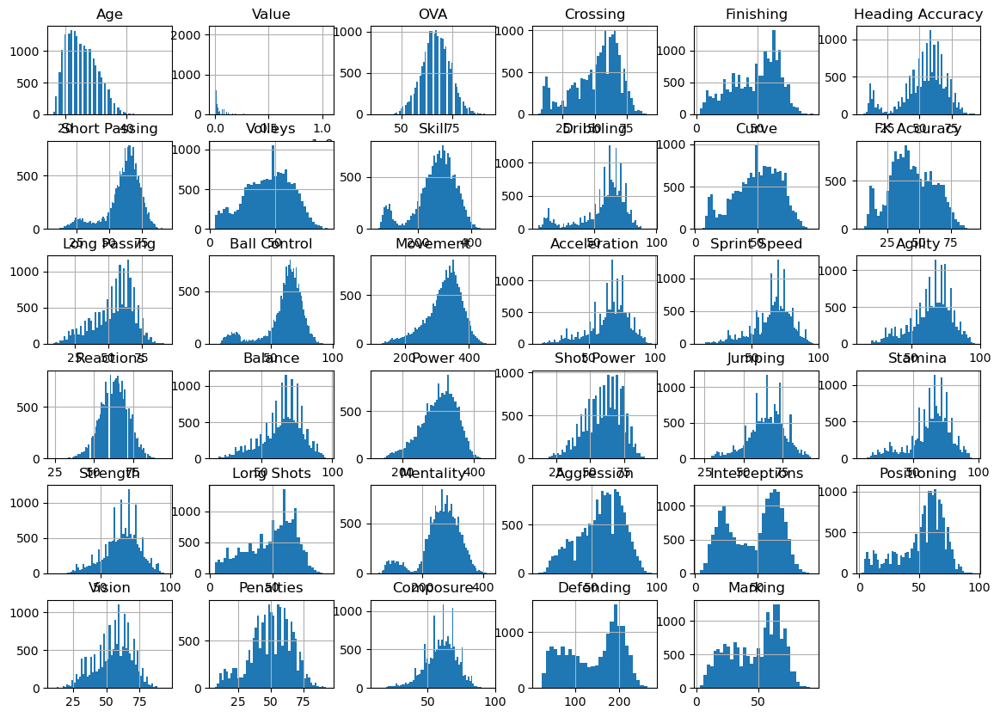

In [219]:
fifa_correlation.hist(bins='auto', figsize=(14, 10))

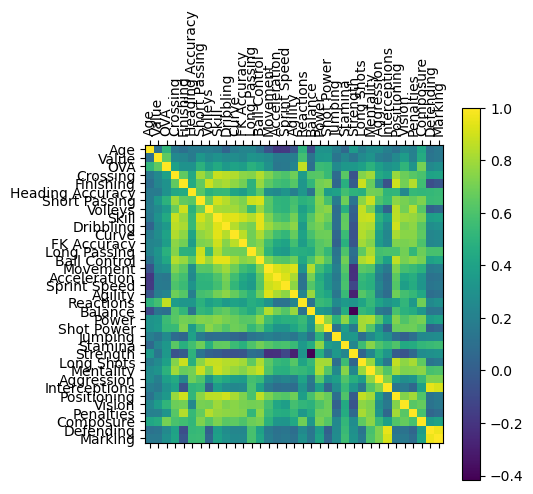

In [220]:
plt.matshow(fifa_correlation.corr())
plt.xticks(range(35), fifa_correlation.corr().columns, rotation=90)
plt.yticks(range(35), fifa_correlation.corr().columns)
plt.colorbar()
plt.show()

In [20]:
#checking the correlation 
fifa_correlation['OVA'].corr(fifa_correlation['Value'])

0.6481075021179304

In [21]:
fifa_correlation['Age'].corr(fifa_correlation['Value'])

0.11189698022150396

In [22]:
# calculate correlation matrix
corr_matrix = fifa_correlation[['Age', 'Value','OVA', 'Crossing',
 'Finishing',
 'Heading Accuracy',
 'Short Passing',
 'Volleys',
 'Skill',
 'Dribbling',
 'Curve',
 'FK Accuracy',
 'Long Passing',
 'Ball Control',
 'Movement',
 'Acceleration',
 'Sprint Speed',
 'Agility',
 'Reactions',
 'Balance',
 'Power',
 'Shot Power',
 'Jumping',
 'Stamina',
 'Strength',
 'Long Shots',
 'Mentality',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Defending',
 'Marking']].corr()
corr_matrix

,Age,Value,OVA,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Skill,Dribbling,...,Long Shots,Mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Defending,Marking
Age,1.000000,0.111897,0.517099,0.151022,0.105311,0.172793,0.176786,0.187794,0.168876,0.039607,...,0.190803,0.272976,0.276063,0.192996,0.122566,0.236343,0.198917,0.421126,0.114796,0.155497
Value,0.111897,1.000000,0.648108,0.254703,0.235543,0.172183,0.334814,0.260264,0.305846,0.264454,...,0.262147,0.312981,0.195356,0.156255,0.250233,0.368406,0.208452,0.455747,0.132279,0.156878
OVA,0.517099,0.648108,1.000000,0.386334,0.304012,0.305553,0.492372,0.362712,0.441689,0.350249,...,0.390849,0.495097,0.382813,0.305286,0.339838,0.507683,0.317666,0.706141,0.248247,0.290071
Crossing,0.151022,0.254703,0.386334,1.000000,0.651366,0.433727,0.799446,0.678891,0.883129,0.855444,...,0.737392,0.795752,0.446769,0.395250,0.783156,0.684262,0.633326,0.595859,0.401941,0.410757
Finishing,0.105311,0.235543,0.304012,0.651366,1.000000,0.450864,0.652836,0.890492,0.787127,0.821016,...,0.883941,0.672655,0.231947,-0.065349,0.895321,0.697643,0.837941,0.564830,-0.074818,-0.031423
Heading Accuracy,0.172793,0.172183,0.305553,0.433727,0.450864,1.000000,0.630927,0.487343,0.528846,0.530891,...,0.476846,0.695786,0.687222,0.512477,0.515146,0.241807,0.533606,0.521468,0.528911,0.544815
Short Passing,0.176786,0.334814,0.492372,0.799446,0.652836,0.630927,1.000000,0.685680,0.902316,0.841956,...,0.752323,0.888839,0.608875,0.531686,0.753849,0.707340,0.665632,0.726914,0.535244,0.551198
Volleys,0.187794,0.260264,0.362712,0.678891,0.890492,0.487343,0.685680,1.000000,0.815831,0.802134,...,0.871588,0.716095,0.309988,0.031370,0.855862,0.696931,0.841674,0.624023,0.020068,0.059609
Skill,0.168876,0.305846,0.441689,0.883129,0.787127,0.528846,0.902316,0.815831,1.000000,0.933575,...,0.874169,0.884565,0.496194,0.367620,0.860381,0.791951,0.776707,0.718256,0.370467,0.389143
Dribbling,0.039607,0.264454,0.350249,0.855444,0.821016,0.530891,0.841956,0.802134,0.933575,1.000000,...,0.841300,0.823690,0.432044,0.265925,0.897909,0.725026,0.756968,0.638531,0.280107,0.300938


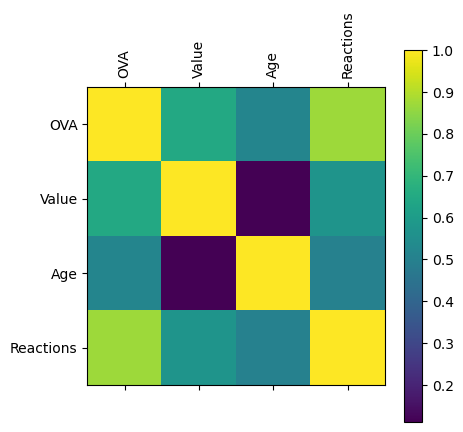

In [164]:
fifa_correlations1 = fifa_correlation[['OVA','Value', 'Age', 'Reactions']]
plt.matshow(fifa_correlations1.corr())
plt.xticks(range(4), fifa_correlations1.corr().columns, rotation=90)
plt.yticks(range(4), fifa_correlations1.corr().columns)
plt.colorbar()
plt.show()

In [223]:
fifa_correlation['OVA'].corr(fifa_correlation['Value'])

0.6481075021179304

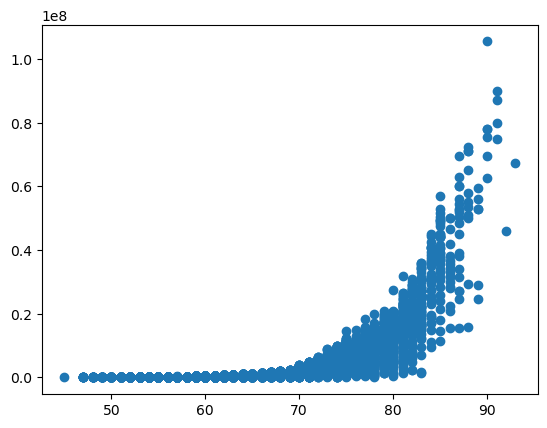

In [24]:
x = fifa_correlation['OVA']
y = fifa_correlation['Value']

plt.scatter(x,y)
plt.show()

Linear Regression

In [28]:
model = linear_model.LinearRegression()
x = x.reshape(-1, 1)
result = model.fit(x,y)
display(result.intercept_)
display(result.coef_) # coefficients is an array because later we will see we can have more than one dimension for our gradient

AttributeError: 'Series' object has no attribute 'reshape'

In [26]:
from sklearn.linear_model import LinearRegression
x = x.reshape(-1, 1)

# Create a linear regression model and fit the data
model = LinearRegression()
result = model.fit(x, y)

# Print the intercept and coefficients
print(result.intercept_)
print(result.coef_)

AttributeError: 'Series' object has no attribute 'reshape'